In [31]:
# Voxel-Based Cone-Casting Shadow Attenuation Matrix Generator
#
# This script implements an advanced framework to simulate light attenuation
# using a cone-casting method to account for the sun's angular diameter,
# producing more realistic soft shadows (penumbra).
#
# This version is configured to analyze a single point at the center of the LiDAR scene
# and supports multiple vegetation classes with distinct attenuation coefficients.
#
# NOTE: This version has been simplified to run sequentially without Numba or
# multiprocessing to ensure stability and ease of debugging. Performance will be
# significantly lower than optimized versions.
#
# The pipeline is as follows:
# 1. Data Ingestion: Reads and filters classified LiDAR data (.las/.laz).
# 2. Voxelization: Converts the point cloud into a 3D voxel grid.
# 3. Building Extrusion: Fills voxels below building roof points to create solid structures.
# 4. Iterative Cone-Casting: For each solar position, it generates a cone of
#    rays representing the sun's disk.
# 5. Attenuation Modeling: For each ray in the cone, it calculates transmittance
#    based on binary occlusion (buildings) or the Beer-Lambert law (vegetation),
#    using class-specific extinction coefficients.
# 6. Output Generation: The final transmittance for a solar position is the
#    average of all rays in the cone. These values are aggregated into a
#    2D matrix and saved as a CSV file.
#
# Key Libraries:
# - laspy: For reading LiDAR files.
# - numpy: For numerical operations and data structures.
# - pandas: For creating and exporting the final CSV data matrix.

import os
import time
import math

import laspy
import numpy as np
import pandas as pd

# --- CONFIGURATION ---
# Set all simulation parameters in this section.

# 1. Input Data and Scene Definition
LIDAR_FILE_PATH = 'data/reclassified_buildings_clean_200_hag.laz'
OUTPUT_DIRECTORY = 'results/shadow_matrix_results'
OUTPUT_FILENAME = 'shadow_attenuation_matrix_conecasting_l_n.csv'
BOUNDING_BOX = None


# --- NEW: Specific target coordinates for analysis ---
TARGET_COORDS_2D = np.array([532886, 6983516])

# ASPRS Standard Classification Codes
# Including multiple vegetation classes (3: Low, 4: Medium, 5: High)
RELEVANT_CLASSES = {2, 3, 4, 5, 6}
GROUND_CLASS_CODE = 2
BUILDING_CLASS_CODE = 6
VEGETATION_CLASS_CODES = {3, 4, 5}

# Priority for voxel classification (higher number = higher priority)
# High vegetation (5) has priority over medium (4), etc.
CLASS_PRIORITY = {6: 4, 5: 3, 4: 2, 3: 1, 2: 0, 0: -1}

# 2. Voxelization Parameters
VOXEL_SIZE = 0.5

# 3. Solar Position & Cone-Casting Simulation Parameters
AZIMUTH_STEPS = 360  # 1-degree steps
ELEVATION_STEPS = 91 # 1-degree steps (0-90 inclusive)

# --- NEW: Cone-Casting Parameters ---
# The sun's angular radius is approx 0.265 degrees.
SOLAR_ANGULAR_RADIUS_DEG = 0.265
# Number of rays to cast to approximate the solar disk. More rays = more
# accurate penumbra but longer computation time.
NUM_RAYS_PER_CONE = 16

# 4. Ray-Casting and Attenuation Parameters
# --- UPDATED: Class-specific extinction coefficients ---
# Assign a different base extinction coefficient (k) to each vegetation class.
# These values may need to be calibrated for specific vegetation types.
VEGETATION_EXTINCTION_COEFFICIENTS = {
    3: 0.7,  # k for Low Vegetation
    4: 0.6,  # k for Medium Vegetation
    5: 0.6   # k for High Vegetation
}

In [32]:
from shadow_model.visual_utils import *
fig = view_lidar_classes(LIDAR_FILE_PATH)

In [144]:
# --- MODULE 1: DATA INGESTOR & PREPARER ---

def load_and_prepare_lidar(file_path, bounding_box=None, relevant_classes=None):
    """
    Reads a LAS/LAZ file, filters points by classification and bounding box.
    """
    print(f"Loading LiDAR data from {file_path}...")
    if not os.path.exists(file_path):
        print(f"Error: File not found at {file_path}")
        return None, None
    try:
        las = laspy.read(file_path)
    except Exception as e:
        print(f"Error reading file: {e}")
        return None, None

    points_xyz = np.vstack((las.x, las.y, las.z)).transpose()
    classifications = np.array(las.classification)

    mask = np.ones(len(points_xyz), dtype=bool)
    if bounding_box:
        mask &= (
            (points_xyz[:, 0] >= bounding_box['X_MIN']) & (points_xyz[:, 0] < bounding_box['X_MAX']) &
            (points_xyz[:, 1] >= bounding_box['Y_MIN']) & (points_xyz[:, 1] < bounding_box['Y_MAX'])
        )
    if relevant_classes:
        mask &= np.isin(classifications, list(relevant_classes))

    filtered_points = points_xyz[mask]
    filtered_classifications = classifications[mask]

    if len(filtered_points) == 0:
        print("Warning: No points remaining after filtering.")
        return None, None
    print(f"Data loaded and filtered. {len(filtered_points)} points remaining.")
    return filtered_points, filtered_classifications


# --- MODULE 2: VOXELIZER ---

def voxelize_scene(points, classifications, voxel_size):
    """
    Converts a point cloud into classification and density voxel grids.
    Includes a step to extrude building footprints downwards.
    """
    if points is None or len(points) == 0:
        return None, None, None, None

    print("Voxelizing the scene...")
    scene_min = np.min(points, axis=0)
    scene_max = np.max(points, axis=0)
    grid_dims = np.ceil((scene_max - scene_min) / voxel_size).astype(int)
    print(f"Voxel grid dimensions: {grid_dims}")

    classification_grid = np.zeros(grid_dims, dtype=np.int8)
    density_grid = np.zeros(grid_dims, dtype=np.float32)

    voxel_indices = np.floor((points - scene_min) / voxel_size).astype(int)
    for i in range(3):
        voxel_indices[:, i] = np.clip(voxel_indices[:, i], 0, grid_dims[i] - 1)

    print("Populating classification and density grids from points...")
    for i in range(len(points)):
        idx = tuple(voxel_indices[i])
        current_class = classifications[i]
        if CLASS_PRIORITY.get(current_class, -1) > CLASS_PRIORITY.get(classification_grid[idx], -1):
            classification_grid[idx] = current_class
        if current_class in VEGETATION_CLASS_CODES:
            density_grid[idx] += 1

    # --- NEW: Extrude building footprints downwards ---
    print("Extruding building footprints to create solid models...")
    building_indices = np.argwhere(classification_grid == BUILDING_CLASS_CODE)

    for ix, iy, iz in building_indices:
        # Iterate from the voxel below the roof down to the ground level (z=0)
        for z_level in range(iz - 1, -1, -1):
            # Only fill if the voxel below has a lower priority class
            if CLASS_PRIORITY.get(classification_grid[ix, iy, z_level], -1) < CLASS_PRIORITY[BUILDING_CLASS_CODE]:
                classification_grid[ix, iy, z_level] = BUILDING_CLASS_CODE
            else:
                # Stop if we hit something with equal or higher priority (e.g., another building part)
                break
    print("Building extrusion complete.")

    voxel_volume = voxel_size ** 3
    vegetation_voxels = np.isin(classification_grid, list(VEGETATION_CLASS_CODES))
    density_grid[vegetation_voxels] /= voxel_volume
    
    print("Voxelization complete.")
    return classification_grid, density_grid, scene_min, grid_dims


# --- MODULE 3: RAY-CASTING & CONE-CASTING ENGINE ---


def generate_cone_vectors(center_direction, radius_rad, num_samples):
    """
    Generates a set of vectors distributed within a cone around a center direction.
    """
    # Create a basis (a coordinate system) aligned with the center_direction
    if np.allclose(np.abs(center_direction), [0, 0, 1]):
        # Handle case where direction is along Z-axis
        v_up = np.array([0, 1, 0])
    else:
        v_up = np.array([0, 0, 1])
    
    u = np.cross(v_up, center_direction)
    u /= np.linalg.norm(u)
    v = np.cross(center_direction, u)

    cone_vectors = []
    # Use stratified sampling for better distribution
    for i in range(num_samples):
        # Sample radius and angle to get points on a disk
        r = radius_rad * np.sqrt((i + 0.5) / num_samples)
        theta = 2 * np.pi * 0.61803398875 * i # Golden angle for good distribution

        # Map disk point to 3D offset and add to center direction
        offset_vec = r * (np.cos(theta) * u + np.sin(theta) * v)
        new_vec = center_direction + offset_vec
        new_vec /= np.linalg.norm(new_vec) # Re-normalize
        cone_vectors.append(new_vec)
        
    return cone_vectors

def trace_ray_fast(ray_origin, ray_direction, scene_min, voxel_size, grid_dims):
    """
    An efficient voxel traversal algorithm (Amanatides-Woo).
    """
    ray_pos = (ray_origin - scene_min) / voxel_size
    ix, iy, iz = int(ray_pos[0]), int(ray_pos[1]), int(ray_pos[2])
    step_x = 1 if ray_direction[0] >= 0 else -1
    step_y = 1 if ray_direction[1] >= 0 else -1
    step_z = 1 if ray_direction[2] >= 0 else -1
    
    next_voxel_boundary_x = (ix + (step_x > 0)) * voxel_size + scene_min[0]
    next_voxel_boundary_y = (iy + (step_y > 0)) * voxel_size + scene_min[1]
    next_voxel_boundary_z = (iz + (step_z > 0)) * voxel_size + scene_min[2]
    
    t_max_x = (next_voxel_boundary_x - ray_origin[0]) / ray_direction[0] if ray_direction[0] != 0 else float('inf')
    t_max_y = (next_voxel_boundary_y - ray_origin[1]) / ray_direction[1] if ray_direction[1] != 0 else float('inf')
    t_max_z = (next_voxel_boundary_z - ray_origin[2]) / ray_direction[2] if ray_direction[2] != 0 else float('inf')
    
    t_delta_x = voxel_size / abs(ray_direction[0]) if ray_direction[0] != 0 else float('inf')
    t_delta_y = voxel_size / abs(ray_direction[1]) if ray_direction[1] != 0 else float('inf')
    t_delta_z = voxel_size / abs(ray_direction[2]) if ray_direction[2] != 0 else float('inf')

    while True:
        if not (0 <= ix < grid_dims[0] and 0 <= iy < grid_dims[1] and 0 <= iz < grid_dims[2]):
            break
        yield (ix, iy, iz)
        if t_max_x < t_max_y:
            if t_max_x < t_max_z:
                ix += step_x; t_max_x += t_delta_x
            else:
                iz += step_z; t_max_z += t_delta_z
        else:
            if t_max_y < t_max_z:
                iy += step_y; t_max_y += t_delta_y
            else:
                iz += step_z; t_max_z += t_delta_z

def calculate_transmittance(voxel_path_generator, classification_grid, density_grid, voxel_size, k_coeffs):
    """
    Calculates the final transmittance for a single ray path, using class-specific
    extinction coefficients for different vegetation types.
    """
    transmittance = 1.0
    path_length_in_voxel = voxel_size
    for ix, iy, iz in voxel_path_generator:
        voxel_class = classification_grid[ix, iy, iz]
        if voxel_class == BUILDING_CLASS_CODE: return 0.0
        
        # Check if the voxel is any type of vegetation
        if voxel_class in VEGETATION_CLASS_CODES:
            k_base = k_coeffs.get(voxel_class, 0.0) # Look up the correct k
            if k_base > 0:
                density = density_grid[ix, iy, iz]
                if density > 0:
                    k = k_base * density
                    transmittance *= math.exp(-k * path_length_in_voxel)
        
        if transmittance < 1e-6: return 0.0
    return transmittance


# --- MAIN EXECUTION ---

if __name__ == '__main__':
    start_time = time.time()
    
    # 1. Load and Prepare Data
    points, classifications = load_and_prepare_lidar(
        LIDAR_FILE_PATH, BOUNDING_BOX, RELEVANT_CLASSES
    )
    if points is None: exit()

    # 2. Voxelize Scene
    classification_grid, density_grid, scene_min, grid_dims = voxelize_scene(
        points, classifications, VOXEL_SIZE
    )
    if classification_grid is None: exit()
    scene_max = scene_min + grid_dims * VOXEL_SIZE

    # 3. Define the single analysis point using the specified coordinates
    print(f"Using specified target coordinates: {TARGET_COORDS_2D}")

    # Find the Z value for the highest point (e.g., a roof) at the target coordinates.
    search_radius = 1 # 5 meters
    points_near_target_mask = (
        (points[:, 0] > TARGET_COORDS_2D[0] - search_radius) &
        (points[:, 0] < TARGET_COORDS_2D[0] + search_radius) &
        (points[:, 1] > TARGET_COORDS_2D[1] - search_radius) &
        (points[:, 1] < TARGET_COORDS_2D[1] + search_radius)
    )
    points_near_target = points[points_near_target_mask]

    if len(points_near_target) > 0:
        # Find the highest Z value in the vicinity of the target
        target_z = np.max(points_near_target[:, 2]) - 1.0 # Slightly below the roof
        print(f"Found target Z coordinate from LiDAR data: {target_z}")
    else:
        print(f"Warning: No LiDAR points found near target coordinates. Using scene maximum Z as a fallback.")
        target_z = scene_max[2]

    # analysis_point = np.array([TARGET_COORDS_2D[0], TARGET_COORDS_2D[1], np.ceil(target_z)])
    analysis_point = np.array([TARGET_COORDS_2D[0], TARGET_COORDS_2D[1], target_z])

    print(f"Analysis point set to: {analysis_point}")

    # 4. Define Solar Angles and Run Simulation Loop (SEQUENTIAL)
    azimuths = np.linspace(0, 2 * np.pi, AZIMUTH_STEPS, endpoint=False)
    elevations = np.linspace(0, np.pi / 2, ELEVATION_STEPS, endpoint=True)
    solar_radius_rad = np.deg2rad(SOLAR_ANGULAR_RADIUS_DEG)
    
    simulation_results = []
    
    total_directions = len(azimuths) * (len(elevations) - 1)
    print(f"\n--- Starting SEQUENTIAL Cone-Casting Simulation ---")
    print(f"Casting {NUM_RAYS_PER_CONE} rays per cone for each of {total_directions} solar positions...")
    
    current_direction = 0
    for el in elevations:
        if el < 0.001: continue
        
        for az in azimuths:
            current_direction += 1
            # if Azimuth is from 270 to 360, use the target_z + 0.5
            if 270 <= np.rad2deg(az) < 360:
                analysis_point[2] = target_z + 0.5
            # elif 180 <= np.rad2deg(az) < 270:
            #     analysis_point[2] = target_z + 1.0
            if current_direction % 500 == 0:
                 print(f"Processing direction {current_direction} of {total_directions} (Az: {np.rad2deg(az):.1f}°, El: {np.rad2deg(el):.1f}°)...")
            
            center_ray_direction = np.array([np.cos(el) * np.sin(az), np.cos(el) * np.cos(az), np.sin(el)])
            
            cone_ray_vectors = generate_cone_vectors(center_ray_direction, solar_radius_rad, NUM_RAYS_PER_CONE)
            
            cone_transmittances = []
            for ray_vec in cone_ray_vectors:
                voxel_size = VOXEL_SIZE
                voxel_path_gen = trace_ray_fast(analysis_point, ray_vec, scene_min, voxel_size, grid_dims)
                transmittance = calculate_transmittance(
                    voxel_path_gen, classification_grid, density_grid, voxel_size, VEGETATION_EXTINCTION_COEFFICIENTS
                )
                cone_transmittances.append(transmittance)
            
            avg_transmittance = np.mean(cone_transmittances)
            
            simulation_results.append({
                'azimuth': az, 'elevation': el, 'transmittance': avg_transmittance
            })

    # 5. Format and Save Final Attenuation Matrix
    print("\n--- Aggregating Results into CSV Matrix ---")
    if not simulation_results:
        print("No results to save. Exiting.")
        exit()

    df = pd.DataFrame(simulation_results)
    df['azimuth_deg'] = np.round(np.rad2deg(df['azimuth'])).astype(int)
    df['elevation_deg'] = np.round(np.rad2deg(df['elevation'])).astype(int)
    
    shadow_matrix_df = df.pivot_table(
        index='elevation_deg', columns='azimuth_deg', values='transmittance'
    )
    
    # Format headers to match the example output
    shadow_matrix_df.index = [f"Altitude_{i}" for i in shadow_matrix_df.index]
    shadow_matrix_df.columns = [f"Azimuth_{c}" for c in shadow_matrix_df.columns]
    
    # Sort the DataFrame by numeric index and columns to ensure correct order
    shadow_matrix_df = shadow_matrix_df.sort_index(key=lambda x: np.array([int(i.split('_')[1]) for i in x]))
    shadow_matrix_df = shadow_matrix_df.sort_index(axis=1, key=lambda x: np.array([int(i.split('_')[1]) for i in x]))

    shadow_matrix_df = 1- shadow_matrix_df  # Convert to shadow attenuation (1 - transmittance)

        # --- NEW: Add Azimuth_360 column as a copy of Azimuth_0 ---
    if 'Azimuth_0' in shadow_matrix_df.columns:
        shadow_matrix_df['Azimuth_360'] = shadow_matrix_df['Azimuth_0']

    if not os.path.exists(OUTPUT_DIRECTORY):
        os.makedirs(OUTPUT_DIRECTORY)
        
    output_path = os.path.join(OUTPUT_DIRECTORY, OUTPUT_FILENAME)
    # Write to CSV with header and index
    shadow_matrix_df.to_csv(output_path, header=True, index=True)
    
    end_time = time.time()
    print(f"\n--- Simulation Finished ---")
    print(f"Total execution time: {end_time - start_time:.2f} seconds")
    print(f"Saved shadow attenuation matrix to {output_path}")

Loading LiDAR data from data/reclassified_buildings_clean_200_hag.laz...
Data loaded and filtered. 389496 points remaining.
Voxelizing the scene...
Voxel grid dimensions: [400 400  63]
Populating classification and density grids from points...
Extruding building footprints to create solid models...
Building extrusion complete.
Voxelization complete.
Using specified target coordinates: [ 532886 6983516]
Found target Z coordinate from LiDAR data: 6.5600000000000005
Analysis point set to: [5.328860e+05 6.983516e+06 6.560000e+00]

--- Starting SEQUENTIAL Cone-Casting Simulation ---
Casting 16 rays per cone for each of 32400 solar positions...
Processing direction 500 of 32400 (Az: 139.0°, El: 2.0°)...
Processing direction 1000 of 32400 (Az: 279.0°, El: 3.0°)...
Processing direction 1500 of 32400 (Az: 59.0°, El: 5.0°)...
Processing direction 2000 of 32400 (Az: 199.0°, El: 6.0°)...
Processing direction 2500 of 32400 (Az: 339.0°, El: 7.0°)...
Processing direction 3000 of 32400 (Az: 119.0°, El

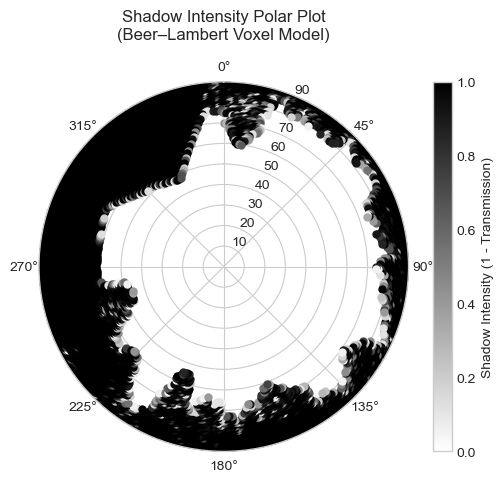

In [145]:
from shadow_model.visual_utils import *

altitude_range = np.arange(0, 90, 1)
azimuth_range = np.arange(0, 360, 1)

plot_shadow_polar(shadow_matrix_df.values, altitude_range, azimuth_range)

In [146]:
# --- PV Forecast Comparison Plotter ---
#
# This script generates a single plot comparing the performance of different
# PV forecast models against the measured, real-world power output for a
# user-selected day.
#
# The plot will show four distinct time series:
# 1. Real PV Output: The actual, measured power generation.
# 2. Clear-Sky Prediction: The ideal forecast with no shadow correction.
# 3. Direct Version Forecast: The forecast corrected by a direct, single-point
#    lookup in the shadow matrix.
# 4. Windowed Version Forecast: The forecast corrected by averaging a small
#    area ("box blur") of the shadow matrix.
import os

import numpy as np
import pandas as pd
from datetime import datetime
import time
import matplotlib.pyplot as plt

# Import the project's modules
import miniPVforecast
import shadowmap
import csv_reader

# --- CONFIGURATION ---
# --- Select the day you want to plot here ---
DAY_TO_PLOT = datetime(2021, 5, 7)

# --- Path to the shadow matrix to use for the forecast ---
# This should point to your best-performing, calibrated matrix.
SHADOW_MATRIX_PATH = 'results/shadow_matrix_results/shadow_attenuation_matrix_conecasting_l_n.csv'

# --- Define the radius for the "windowed" version ---
WINDOW_RADIUS = 20



def generate_comparison_plot(day_to_plot):

    # feeding parameters to pvmodel
    tilt = 12
    azimuth = 170
    longitude = 27.648656
    latitude = 62.979848

    miniPVforecast.tilt = tilt
    miniPVforecast.azimuth = azimuth
    miniPVforecast.longitude = longitude
    miniPVforecast.latitude = latitude
    miniPVforecast.rated_power = 3.960 * 0.81
    """
    Main function to load data, run models, and generate the plot.
    """
    print(f"--- Generating forecast comparison plot for {day_to_plot.date()} ---")
    start_time = time.time()
    
    # --- 1. Load Data ---
    
    # Temporarily modify csv_reader to load the correct matrix and fix the index
    original_get_shadowdata = csv_reader.get_shadowdata
    def load_and_fix_shadow_matrix(dense=True):
        print(f"Loading shadow matrix: {SHADOW_MATRIX_PATH}")
        df = pd.read_csv(SHADOW_MATRIX_PATH, index_col=0)
        df.index = df.index.str.replace('Altitude_', '').astype(int)
        return df
    csv_reader.get_shadowdata = load_and_fix_shadow_matrix
    
    print("Loading historical PV data...")
    full_pv_data = csv_reader.get_year(day_to_plot.year)
    
    # Get the measured data for the selected day
    time_end = day_to_plot + pd.Timedelta(days=1)
    pv_data_for_day = full_pv_data[(full_pv_data.index >= day_to_plot) & (full_pv_data.index < time_end)].copy()

    # time_end =  time_start + timedelta(days=dayrange)#datetime(2021, 10, 5)

    # df = df[(df.index >= time_start) & (df.index <= time_end)]
    
    if pv_data_for_day.empty:
        print(f"Error: No PV data found for {day_to_plot.date()}.")
        return

    # --- 2. Calculate the Four Data Series ---

    # Series 1: Real PV Output
    real_pv_output = pv_data_for_day["Energia MPP1 | Symo 8.2-3-M (1)"]

    # Series 2: Clear-Sky Prediction
    clearsky_forecast = miniPVforecast.get_pvlib_cleasky_irradiance(pv_data_for_day.index)

    # Prepare for shadow models
    azimuths, zeniths = miniPVforecast.get_solar_azimuth_zenit_fast(pv_data_for_day.index)
    pv_data_for_day["azimuth"] = azimuths
    pv_data_for_day["zenith"] = zeniths
    
    # Series 3: Direct Version Forecast (radius=0)
    pv_data_for_day["shading_direct"] = shadowmap.add_box_blur_shading_to_pv_output_df(pv_data_for_day, radius=0, max=False)
    direct_forecast = miniPVforecast.get_pvlib_shaded_clearsky_irradiance(pv_data_for_day.index, pv_data_for_day["shading_direct"])

    # Series 4: Windowed Version Forecast (radius=WINDOW_RADIUS)
    pv_data_for_day["shading_blur"] = shadowmap.add_box_blur_shading_to_pv_output_df(pv_data_for_day, radius=WINDOW_RADIUS, max=False)
    windowed_forecast = miniPVforecast.get_pvlib_shaded_clearsky_irradiance(pv_data_for_day.index, pv_data_for_day["shading_blur"])

    # Restore original csv_reader function
    csv_reader.get_shadowdata = original_get_shadowdata

    # --- 3. Plot the Results ---
    
    print("Generating plot...")
    plt.style.use('seaborn-v0_8-whitegrid')
    fig, ax = plt.subplots(figsize=(16, 9))

    # Plot each series with distinct styles
    ax.plot(real_pv_output.index, real_pv_output, label='1. Real PV Output', color='black', linewidth=2.5, zorder=4)
    ax.plot(clearsky_forecast.index, clearsky_forecast['output'], label='2. Clear-Sky Prediction', color='red', linestyle='--', linewidth=2, zorder=1)
    ax.plot(direct_forecast.index, direct_forecast['output'], label='3. Direct Version Forecast', color='green', linestyle=':', linewidth=2, zorder=2)
    ax.plot(windowed_forecast.index, windowed_forecast['output'], label=f'4. Windowed Version (r={WINDOW_RADIUS})', color='deepskyblue', linestyle='-', linewidth=2, zorder=3)

    # Formatting
    ax.set_title(f'PV Forecast Model Comparison for {day_to_plot.date()}', fontsize=18, fontweight='bold')
    ax.set_xlabel('Time of Day', fontsize=12)
    ax.set_ylabel('Power [W]', fontsize=12)
    ax.legend(fontsize=11)
    ax.grid(True, which='both', linestyle='--', linewidth=0.5)
    ax.set_xlim(pv_data_for_day.index.min(), pv_data_for_day.index.max())
    ax.set_ylim(bottom=0)
    
    # Improve date formatting on x-axis
    import matplotlib.dates as mdates
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
    
    fig.tight_layout()
    
    # Save the figure
    output_dir = "figures/comparison_plots"
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    filename = f"forecast_comparison_{day_to_plot.strftime('%Y-%m-%d')}.png"
    output_path = os.path.join(output_dir, filename)
    plt.savefig(output_path, dpi=150)
    print(f"Plot saved to {output_path}")
    
    end_time = time.time()
    print(f"Script finished in {end_time - start_time:.2f} seconds.")
    
    plt.show()

--- Generating forecast comparison plot for 2021-05-15 ---
Loading historical PV data...
Loading shadow matrix: results/shadow_matrix_results/shadow_attenuation_matrix_conecasting_l_n.csv
Loading shadow matrix: results/shadow_matrix_results/shadow_attenuation_matrix_conecasting_l_n.csv
Generating plot...
Plot saved to figures/comparison_plots/forecast_comparison_2021-05-15.png
Script finished in 8.97 seconds.


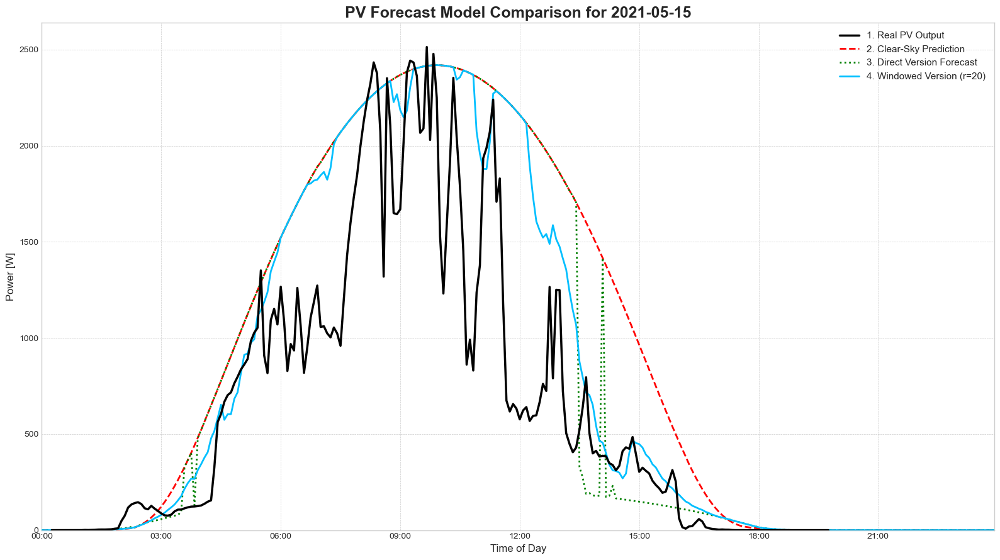

In [147]:
generate_comparison_plot(datetime(2021, 5, 15))

In [148]:
if not os.path.exists(OUTPUT_DIRECTORY):
        os.makedirs(OUTPUT_DIRECTORY)
        
output_path = os.path.join(OUTPUT_DIRECTORY, "shadow_matrix_re.csv")
# Write to CSV without header or index
shadow_matrix_df = 1- shadow_matrix_df
shadow_matrix_df.to_csv(output_path)

In [149]:
shadow_matrix_df

,Azimuth_0,Azimuth_1,Azimuth_2,Azimuth_3,Azimuth_4,Azimuth_5,Azimuth_6,Azimuth_7,Azimuth_8,Azimuth_9,...,Azimuth_351,Azimuth_352,Azimuth_353,Azimuth_354,Azimuth_355,Azimuth_356,Azimuth_357,Azimuth_358,Azimuth_359,Azimuth_360
Altitude_1,0.000002,0.000064,0.000163,0.000000,0.000018,0.0,0.000000,0.000000e+00,0.0,0.0,...,0.0,0.0,0.0,0.000061,0.000000,0.000009,0.148389,0.035049,0.318176,0.000002
Altitude_2,0.000291,0.000159,0.000005,0.000000,0.000000,0.0,0.000566,0.000000e+00,0.0,0.0,...,0.0,0.0,0.0,0.000047,0.000000,0.000099,0.002125,0.467907,0.199389,0.000291
Altitude_3,0.000016,0.000002,0.000528,0.000047,0.000004,0.0,0.001084,7.680262e-07,0.0,0.0,...,0.0,0.0,0.0,0.001033,0.000000,0.082230,0.443365,0.477750,0.000005,0.000016
Altitude_4,0.000157,0.000002,0.001144,0.000008,0.000000,0.0,0.000047,0.000000e+00,0.0,0.0,...,0.0,0.0,0.0,0.000005,0.000000,0.062547,0.111459,0.438210,0.029999,0.000157
Altitude_5,0.039694,0.000280,0.001179,0.000000,0.000000,0.0,0.000000,5.001071e-06,0.0,0.0,...,0.0,0.0,0.0,0.000004,0.000005,0.165862,0.643553,0.001242,0.070096,0.039694
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Altitude_86,1.000000,1.000000,1.000000,1.000000,1.000000,1.0,1.000000,1.000000e+00,1.0,1.0,...,1.0,1.0,1.0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
Altitude_87,1.000000,1.000000,1.000000,1.000000,1.000000,1.0,1.000000,1.000000e+00,1.0,1.0,...,1.0,1.0,1.0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
Altitude_88,1.000000,1.000000,1.000000,1.000000,1.000000,1.0,1.000000,1.000000e+00,1.0,1.0,...,1.0,1.0,1.0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
Altitude_89,1.000000,1.000000,1.000000,1.000000,1.000000,1.0,1.000000,1.000000e+00,1.0,1.0,...,1.0,1.0,1.0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [150]:
# --- PV Forecast Final Analysis and Plotting ---
#
# This script performs a final, detailed analysis of the PV forecast model's
# performance.
#
# The script will:
# 1. Iterate through all known clear-sky days.
# 2. For each day, compute the RMSE for both the "Clearsky Model" and the
#    final "Window-Blurred Prediction".
# 3. Calculate and report the average RMSE for both models and the average
#    improvement in Watts.
# 4. Automatically identify two key days:
#    - The day with the greatest improvement (largest reduction in error).
#    - The day where the window-blurred model was most accurate (lowest error).
# 5. Generate and save detailed comparison plots for these two specific days.

import numpy as np
import pandas as pd
from datetime import datetime
import time
import os
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error

# Import the project's modules
import miniPVforecast
import shadowmap
import csv_reader

# --- CONFIGURATION ---
# Path to the shadow matrix to use for the forecast
SHADOW_MATRIX_PATH = 'results/shadow_matrix_results/shadow_attenuation_matrix_conecasting_l_n.csv'
    # shadow_matrix_path = 'results/shadow_matrix_results/shadow_attenuation_matrix_conecasting.csv'


# Define the radius for the "windowed" version
WINDOW_RADIUS = 20

# List of known clear-sky days for analysis
LIST_OF_CLEAR_LOOKING_DAYS = [
    datetime(2021, 4, 11), datetime(2021, 4, 15), datetime(2021, 4, 16),
    datetime(2021, 4, 17), datetime(2021, 4, 18), datetime(2021, 4, 19),
    datetime(2021, 5, 12), datetime(2021, 5, 23), datetime(2021, 5, 30),
    datetime(2021, 6, 2), datetime(2021, 6, 4), datetime(2021, 6, 5),
    datetime(2021, 6, 7), datetime(2021, 6, 9), datetime(2021, 6, 11),
    datetime(2021, 6, 29), datetime(2021, 7, 3), datetime(2021, 7, 16),
    datetime(2021, 7, 26), datetime(2021, 7, 27), datetime(2021, 8, 5),
    datetime(2021, 8, 7), datetime(2021, 8, 29), datetime(2021, 9, 10),
    datetime(2021, 9, 22), datetime(2021, 9, 27), datetime(2021, 9, 28),
    datetime(2021, 10, 3)
]

def calculate_rmse(measured, forecast):
    """Calculates the Root Mean Squared Error between two series."""
    comparison_df = pd.DataFrame({'measured': measured, 'forecast': forecast}).dropna()
    if len(comparison_df) < 1:
        return np.nan
    return np.sqrt(mean_squared_error(comparison_df['measured'], comparison_df['forecast']))

def generate_plot_for_day(day_to_plot, full_pv_data):
    """
    Generates and saves a detailed comparison plot for a specific day.
    """
    print(f"\n--- Generating plot for {day_to_plot.date()} ---")
    
    # Get data for the specific day
    time_end = day_to_plot + pd.Timedelta(days=1)
    pv_data_for_day = full_pv_data[(full_pv_data.index >= day_to_plot) & (full_pv_data.index < time_end)].copy()
    if pv_data_for_day.empty:
        print("No data, cannot generate plot.")
        return

    # Calculate the three forecast series
    real_pv_output = pv_data_for_day["Energia MPP1 | Symo 8.2-3-M (1)"]
    clearsky_forecast = miniPVforecast.get_pvlib_cleasky_irradiance(pv_data_for_day.index)
    
    azimuths, zeniths = miniPVforecast.get_solar_azimuth_zenit_fast(pv_data_for_day.index)
    pv_data_for_day["azimuth"] = azimuths
    pv_data_for_day["zenith"] = zeniths
    
    pv_data_for_day["shading_blur"] = shadowmap.add_box_blur_shading_to_pv_output_df(pv_data_for_day, radius=WINDOW_RADIUS, max=False)
    windowed_forecast = miniPVforecast.get_pvlib_shaded_clearsky_irradiance(pv_data_for_day.index, pv_data_for_day["shading_blur"])

    # Plotting
    plt.style.use('seaborn-v0_8-whitegrid')
    fig, ax = plt.subplots(figsize=(16, 9))
    ax.plot(real_pv_output.index, real_pv_output, label='Real PV Output', color='black', linewidth=2.5, zorder=3)
    ax.plot(clearsky_forecast.index, clearsky_forecast['output'], label='Clear-Sky Prediction', color='red', linestyle='--', linewidth=2, zorder=1)
    ax.plot(windowed_forecast.index, windowed_forecast['output'], label='Corrected Prediction', color='deepskyblue', linestyle='-', linewidth=2, zorder=2)

    # Formatting
    ax.set_title(f'PV Forecast Model Comparison for {day_to_plot.date()}', fontsize=18, fontweight='bold')
    ax.set_xlabel('Time of Day', fontsize=12)
    ax.set_ylabel('Power [W]', fontsize=12)
    ax.legend(fontsize=11)
    ax.grid(True, which='both', linestyle='--', linewidth=0.5)
    ax.set_xlim(pv_data_for_day.index.min(), pv_data_for_day.index.max())
    ax.set_ylim(bottom=0)
    
    import matplotlib.dates as mdates
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
    fig.tight_layout()
    
    # Save the figure
    output_dir = "figures/final_analysis"
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    filename = f"final_analysis_{day_to_plot.strftime('%Y-%m-%d')}.png"
    output_path = os.path.join(output_dir, filename)
    plt.savefig(output_path, dpi=150)
    print(f"Plot saved to {output_path}")
    plt.close(fig) # Close the figure to free up memory

def run_final_analysis():
    """
    Main function to run the analysis, summarize results, and trigger plotting.
    """
    # feeding parameters to pvmodel
    tilt = 12
    azimuth = 170
    longitude = 27.648656
    latitude = 62.979848

    miniPVforecast.tilt = tilt
    miniPVforecast.azimuth = azimuth
    miniPVforecast.longitude = longitude
    miniPVforecast.latitude = latitude
    miniPVforecast.rated_power = 3.960 * 0.81

    print("--- Starting Final Model Analysis ---")
    start_time = time.time()

    # --- Setup: Load Shadow Matrix and PV Data ---
    original_get_shadowdata = csv_reader.get_shadowdata
    def load_and_fix_shadow_matrix(dense=True):
        df = pd.read_csv(SHADOW_MATRIX_PATH, index_col=0)
        df.index = df.index.str.replace('Altitude_', '').astype(int)
        return df
    csv_reader.get_shadowdata = load_and_fix_shadow_matrix
    
    print("Loading historical PV data for 2021...")
    full_pv_data = csv_reader.get_year(2021)
    
    results = []
    # --- 1. Loop through each day and compute RMSEs ---
    # and the sums of the energy produced
    sum_clearsky_energy = 0.0
    sum_windowed_energy = 0.0
    sum_real_energy = 0.0
    for day in LIST_OF_CLEAR_LOOKING_DAYS:
        time_end = day + pd.Timedelta(days=1)
        pv_data_for_day = full_pv_data[(full_pv_data.index >= day) & (full_pv_data.index < time_end)].copy()
        
        if pv_data_for_day.empty: continue

        # Clearsky Model
        clearsky_forecast = miniPVforecast.get_pvlib_cleasky_irradiance(pv_data_for_day.index)
        rmse_clearsky = calculate_rmse(pv_data_for_day["Energia MPP1 | Symo 8.2-3-M (1)"], clearsky_forecast['output'])

        # Window-Blurred Model
        azimuths, zeniths = miniPVforecast.get_solar_azimuth_zenit_fast(pv_data_for_day.index)
        pv_data_for_day["azimuth"] = azimuths
        pv_data_for_day["zenith"] = zeniths
        pv_data_for_day["shading_blur"] = shadowmap.add_box_blur_shading_to_pv_output_df(pv_data_for_day, radius=WINDOW_RADIUS, max=False)
        windowed_forecast = miniPVforecast.get_pvlib_shaded_clearsky_irradiance(pv_data_for_day.index, pv_data_for_day["shading_blur"])
        rmse_windowed = calculate_rmse(pv_data_for_day["Energia MPP1 | Symo 8.2-3-M (1)"], windowed_forecast['output'])

        # display(clearsky_forecast['output'].resample('D').sum().values[0])
        # break

        # sum energies
        sum_clearsky_energy += clearsky_forecast['output'].resample('D').sum().values[0]
        sum_windowed_energy += windowed_forecast['output'].resample('D').sum().values[0]
        sum_real_energy += pv_data_for_day["Energia MPP1 | Symo 8.2-3-M (1)"].resample('D').sum().values[0]
        
        # Store results
        results.append({
            'date': day,
            'rmse_clearsky': rmse_clearsky,
            'rmse_windowed': rmse_windowed
        })

    # --- 2. Aggregate and Summarize Results ---
    results_df = pd.DataFrame(results).dropna()
    results_df['improvement'] = results_df['rmse_clearsky'] - results_df['rmse_windowed']
    
    avg_rmse_clearsky = results_df['rmse_clearsky'].mean()
    avg_rmse_windowed = results_df['rmse_windowed'].mean()
    avg_improvement = results_df['improvement'].mean()

    print("\n" + "="*50)
    print("Overall Model Performance (Averaged Across All Days)")
    print("="*50)
    print(f"Average Clearsky Model RMSE:      {avg_rmse_clearsky:.2f} Wh")
    print(f"Average Window-Blurred Model RMSE: {avg_rmse_windowed:.2f} Wh")
    print("-" * 50)
    print(f"Average Improvement in Watt-hours (RMSE): {avg_improvement:.2f} Wh")
    print("="*50)
    print(f"Percentage Improvement: {((avg_rmse_clearsky - avg_rmse_windowed) / avg_rmse_clearsky * 100):.2f}%")

    print(f"\nTotal Energy Produced Over All Days:")
    print(f" - Clearsky Model:      {sum_clearsky_energy/1000:.2f} kWh")
    print(f" - Window-Blurred Model: {sum_windowed_energy/1000:.2f} kWh")
    print(f" - Real Measured Output: {sum_real_energy/1000:.2f} kWh")

    # --- 3. Identify Key Days ---
    day_greatest_improvement = results_df.loc[results_df['improvement'].idxmax()]
    day_smallest_error = results_df.loc[results_df['rmse_windowed'].idxmin()]

    print("\n--- Key Days Identified for Plotting ---")
    print(f"Day with Greatest Improvement: {day_greatest_improvement['date'].date()} (Error reduced by {day_greatest_improvement['improvement']:.2f} Wh)")
    print(f"Day with Smallest Error:       {day_smallest_error['date'].date()} (Windowed RMSE was {day_smallest_error['rmse_windowed']:.2f} Wh)")
    
    # --- 4. Generate Plots for Key Days ---
    generate_plot_for_day(day_greatest_improvement['date'], full_pv_data)
    generate_plot_for_day(day_smallest_error['date'], full_pv_data)

    # Restore original csv_reader function
    csv_reader.get_shadowdata = original_get_shadowdata
    
    # print(f"\nAnalysis complete. Total execution time: {time.time() - start_time:.2f} seconds.")

if __name__ == '__main__':
    run_final_analysis()



--- Starting Final Model Analysis ---
Loading historical PV data for 2021...

Overall Model Performance (Averaged Across All Days)
Average Clearsky Model RMSE:      534.92 Wh
Average Window-Blurred Model RMSE: 338.90 Wh
--------------------------------------------------
Average Improvement in Watt-hours (RMSE): 196.02 Wh
Percentage Improvement: 36.64%

Total Energy Produced Over All Days:
 - Clearsky Model:      6400.29 kWh
 - Window-Blurred Model: 5232.74 kWh
 - Real Measured Output: 4388.55 kWh

--- Key Days Identified for Plotting ---
Day with Greatest Improvement: 2021-10-03 (Error reduced by 312.42 Wh)
Day with Smallest Error:       2021-06-07 (Windowed RMSE was 174.56 Wh)

--- Generating plot for 2021-10-03 ---
Plot saved to figures/final_analysis/final_analysis_2021-10-03.png

--- Generating plot for 2021-06-07 ---
Plot saved to figures/final_analysis/final_analysis_2021-06-07.png


In [151]:
# --- PV Forecast Final Analysis and Plotting ---
#
# This script performs a final, detailed analysis of the PV forecast model's
# performance.
#
# The script will:
# 1. Iterate through all known clear-sky days.
# 2. For each day, compute the RMSE for both the "Clearsky Model" and the
#    final "Window-Blurred Prediction".
# 3. Calculate and report the average RMSE for both models and the average
#    improvement in Watts.
# 4. Automatically identify two key days:
#    - The day with the greatest improvement (largest reduction in error).
#    - The day where the window-blurred model was most accurate (lowest error).
# 5. Generate and save detailed comparison plots for these two specific days.

import numpy as np
import pandas as pd
from datetime import datetime
import time
import os
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error

# Import the project's modules
import miniPVforecast
import shadowmap
import csv_reader

# --- CONFIGURATION ---
# Path to the shadow matrix to use for the forecast
SHADOW_MATRIX_PATH = 'results/shadow_matrix_results/shadow_attenuation_matrix_conecasting_l_n.csv'
    # shadow_matrix_path = 'results/shadow_matrix_results/shadow_attenuation_matrix_conecasting.csv'


# Define the radius for the "windowed" version
WINDOW_RADIUS = 20

# List of known clear-sky days for analysis
LIST_OF_CLEAR_LOOKING_DAYS = [
    datetime(2021, 4, 11), datetime(2021, 4, 15), datetime(2021, 4, 16),
    datetime(2021, 4, 17), datetime(2021, 4, 18), datetime(2021, 4, 19),
    datetime(2021, 5, 12), datetime(2021, 5, 23), datetime(2021, 5, 30),
    datetime(2021, 6, 2), datetime(2021, 6, 4), datetime(2021, 6, 5),
    datetime(2021, 6, 7), datetime(2021, 6, 9), datetime(2021, 6, 11),
    datetime(2021, 6, 29), datetime(2021, 7, 3), datetime(2021, 7, 16),
    datetime(2021, 7, 26), datetime(2021, 7, 27), datetime(2021, 8, 5),
    datetime(2021, 8, 7), datetime(2021, 8, 29), datetime(2021, 9, 10),
    datetime(2021, 9, 22), datetime(2021, 9, 27), datetime(2021, 9, 28),
    datetime(2021, 10, 3)
]

def calculate_rmse(measured, forecast):
    """Calculates the Root Mean Squared Error between two series."""
    comparison_df = pd.DataFrame({'measured': measured, 'forecast': forecast}).dropna()
    if len(comparison_df) < 1:
        return np.nan
    return np.sqrt(mean_squared_error(comparison_df['measured'], comparison_df['forecast']))

def generate_plot_for_day(day_to_plot, full_pv_data):
    """
    Generates and saves a detailed comparison plot for a specific day.
    """
    print(f"\n--- Generating plot for {day_to_plot.date()} ---")
    
    # Get data for the specific day
    time_end = day_to_plot + pd.Timedelta(days=1)
    pv_data_for_day = full_pv_data[(full_pv_data.index >= day_to_plot) & (full_pv_data.index < time_end)].copy()
    if pv_data_for_day.empty:
        print("No data, cannot generate plot.")
        return

    # Calculate the three forecast series
    real_pv_output = pv_data_for_day["Energia MPP1 | Symo 8.2-3-M (1)"]
    clearsky_forecast = miniPVforecast.get_pvlib_cleasky_irradiance(pv_data_for_day.index)
    
    azimuths, zeniths = miniPVforecast.get_solar_azimuth_zenit_fast(pv_data_for_day.index)
    pv_data_for_day["azimuth"] = azimuths
    pv_data_for_day["zenith"] = zeniths
    
    pv_data_for_day["shading_blur"] = shadowmap.add_box_blur_shading_to_pv_output_df(pv_data_for_day, radius=WINDOW_RADIUS, max=False)
    windowed_forecast = miniPVforecast.get_pvlib_shaded_clearsky_irradiance(pv_data_for_day.index, pv_data_for_day["shading_blur"])

    # Plotting
    plt.style.use('seaborn-v0_8-whitegrid')
    fig, ax = plt.subplots(figsize=(16, 9))
    ax.plot(real_pv_output.index, real_pv_output, label='Real PV Output', color='black', linewidth=2.5, zorder=3)
    ax.plot(clearsky_forecast.index, clearsky_forecast['output'], label='Clear-Sky Prediction', color='red', linestyle='--', linewidth=2, zorder=1)
    ax.plot(windowed_forecast.index, windowed_forecast['output'], label='Corrected Prediction', color='deepskyblue', linestyle='-', linewidth=2, zorder=2)

    # Formatting
    ax.set_title(f'PV Forecast Model Comparison for {day_to_plot.date()}', fontsize=18, fontweight='bold')
    ax.set_xlabel('Time of Day', fontsize=12)
    ax.set_ylabel('Power [W]', fontsize=12)
    ax.legend(fontsize=11)
    ax.grid(True, which='both', linestyle='--', linewidth=0.5)
    ax.set_xlim(pv_data_for_day.index.min(), pv_data_for_day.index.max())
    ax.set_ylim(bottom=0)
    
    import matplotlib.dates as mdates
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
    fig.tight_layout()
    
    # Save the figure
    output_dir = "figures/final_analysis"
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    filename = f"final_analysis_{day_to_plot.strftime('%Y-%m-%d')}.png"
    output_path = os.path.join(output_dir, filename)
    plt.savefig(output_path, dpi=150)
    print(f"Plot saved to {output_path}")
    plt.close(fig) # Close the figure to free up memory

def run_final_analysis():
    """
    Main function to run the analysis, summarize results, and trigger plotting.
    """
    # feeding parameters to pvmodel
    tilt = 12
    azimuth = 170
    longitude = 27.648656
    latitude = 62.979848

    miniPVforecast.tilt = tilt
    miniPVforecast.azimuth = azimuth
    miniPVforecast.longitude = longitude
    miniPVforecast.latitude = latitude
    miniPVforecast.rated_power = 3.960 * 0.81

    print("--- Starting Final Model Analysis ---")
    start_time = time.time()

    # --- Setup: Load Shadow Matrix and PV Data ---
    original_get_shadowdata = csv_reader.get_shadowdata
    def load_and_fix_shadow_matrix(dense=True):
        df = pd.read_csv(SHADOW_MATRIX_PATH, index_col=0)
        df.index = df.index.str.replace('Altitude_', '').astype(int)
        return df
    csv_reader.get_shadowdata = load_and_fix_shadow_matrix
    
    print("Loading historical PV data for 2021...")
    full_pv_data = csv_reader.get_year(2021)
    
    results = []
    # --- 1. Loop through each day and compute RMSEs ---
    # and the sums of the energy produced
    sum_clearsky_energy = 0.0
    sum_windowed_energy = 0.0
    sum_real_energy = 0.0
    for day in LIST_OF_CLEAR_LOOKING_DAYS:
        time_end = day + pd.Timedelta(days=1)
        pv_data_for_day = full_pv_data[(full_pv_data.index >= day) & (full_pv_data.index < time_end)].copy()
        
        if pv_data_for_day.empty: continue

        # Clearsky Model
        clearsky_forecast = miniPVforecast.get_pvlib_cleasky_irradiance(pv_data_for_day.index)
        rmse_clearsky = calculate_rmse(pv_data_for_day["Energia MPP1 | Symo 8.2-3-M (1)"], clearsky_forecast['output'])

        # Window-Blurred Model
        azimuths, zeniths = miniPVforecast.get_solar_azimuth_zenit_fast(pv_data_for_day.index)
        pv_data_for_day["azimuth"] = azimuths
        pv_data_for_day["zenith"] = zeniths
        pv_data_for_day["shading_blur"] = shadowmap.add_box_blur_shading_to_pv_output_df(pv_data_for_day, radius=WINDOW_RADIUS, max=False)
        windowed_forecast = miniPVforecast.get_pvlib_shaded_clearsky_irradiance(pv_data_for_day.index, pv_data_for_day["shading_blur"])
        rmse_windowed = calculate_rmse(pv_data_for_day["Energia MPP1 | Symo 8.2-3-M (1)"], windowed_forecast['output'])

        # display(clearsky_forecast['output'].resample('D').sum().values[0])
        # break

        # sum energies
        sum_clearsky_energy += clearsky_forecast['output'].resample('D').sum().values[0]
        sum_windowed_energy += windowed_forecast['output'].resample('D').sum().values[0]
        sum_real_energy += pv_data_for_day["Energia MPP1 | Symo 8.2-3-M (1)"].resample('D').sum().values[0]
        
        # Store results
        results.append({
            'date': day,
            'rmse_clearsky': rmse_clearsky,
            'rmse_windowed': rmse_windowed
        })

    # --- 2. Aggregate and Summarize Results ---
    results_df = pd.DataFrame(results).dropna()
    results_df['improvement'] = results_df['rmse_clearsky'] - results_df['rmse_windowed']
    
    avg_rmse_clearsky = results_df['rmse_clearsky'].mean()
    avg_rmse_windowed = results_df['rmse_windowed'].mean()
    avg_improvement = results_df['improvement'].mean()

    print("\n" + "="*50)
    print("Overall Model Performance (Averaged Across All Days)")
    print("="*50)
    print(f"Average Clearsky Model RMSE:      {avg_rmse_clearsky:.2f} Wh")
    print(f"Average Window-Blurred Model RMSE: {avg_rmse_windowed:.2f} Wh")
    print("-" * 50)
    print(f"Average Improvement in Watt-hours (RMSE): {avg_improvement:.2f} Wh")
    print("="*50)
    print(f"Percentage Improvement: {((avg_rmse_clearsky - avg_rmse_windowed) / avg_rmse_clearsky * 100):.2f}%")

    print(f"\nTotal Energy Produced Over All Days:")
    print(f" - Clearsky Model:      {sum_clearsky_energy/1000:.2f} kWh")
    print(f" - Window-Blurred Model: {sum_windowed_energy/1000:.2f} kWh")
    print(f" - Real Measured Output: {sum_real_energy/1000:.2f} kWh")

    # --- 3. Identify Key Days ---
    day_greatest_improvement = results_df.loc[results_df['improvement'].idxmax()]
    day_smallest_error = results_df.loc[results_df['rmse_windowed'].idxmin()]

    print("\n--- Key Days Identified for Plotting ---")
    print(f"Day with Greatest Improvement: {day_greatest_improvement['date'].date()} (Error reduced by {day_greatest_improvement['improvement']:.2f} Wh)")
    print(f"Day with Smallest Error:       {day_smallest_error['date'].date()} (Windowed RMSE was {day_smallest_error['rmse_windowed']:.2f} Wh)")
    
    # --- 4. Generate Plots for Key Days ---
    generate_plot_for_day(day_greatest_improvement['date'], full_pv_data)
    generate_plot_for_day(day_smallest_error['date'], full_pv_data)

    # Restore original csv_reader function
    csv_reader.get_shadowdata = original_get_shadowdata
    
    # print(f"\nAnalysis complete. Total execution time: {time.time() - start_time:.2f} seconds.")

if __name__ == '__main__':
    run_final_analysis()



--- Starting Final Model Analysis ---
Loading historical PV data for 2021...

Overall Model Performance (Averaged Across All Days)
Average Clearsky Model RMSE:      534.92 Wh
Average Window-Blurred Model RMSE: 338.90 Wh
--------------------------------------------------
Average Improvement in Watt-hours (RMSE): 196.02 Wh
Percentage Improvement: 36.64%

Total Energy Produced Over All Days:
 - Clearsky Model:      6400.29 kWh
 - Window-Blurred Model: 5232.74 kWh
 - Real Measured Output: 4388.55 kWh

--- Key Days Identified for Plotting ---
Day with Greatest Improvement: 2021-10-03 (Error reduced by 312.42 Wh)
Day with Smallest Error:       2021-06-07 (Windowed RMSE was 174.56 Wh)

--- Generating plot for 2021-10-03 ---
Plot saved to figures/final_analysis/final_analysis_2021-10-03.png

--- Generating plot for 2021-06-07 ---
Plot saved to figures/final_analysis/final_analysis_2021-06-07.png


Chart saved to figures/final_analysis/rmse_performance_comparison.png


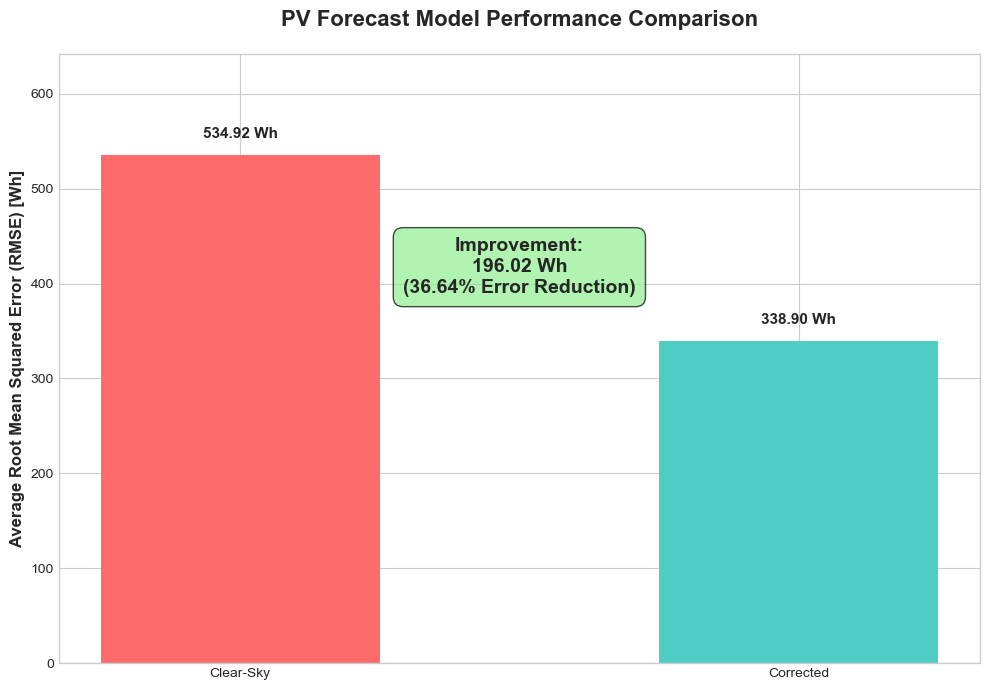

In [152]:
# --- RMSE Comparison Chart Generator ---
#
# This script generates a clean, professional bar chart to visually compare
# the performance of the Clear-Sky model versus the final, shadow-corrected
# model. It highlights the overall improvement in forecast accuracy.
#
# Key Libraries:
# - matplotlib: For creating the plot.
# - numpy: For numerical operations.

import matplotlib.pyplot as plt
import numpy as np
import os

# --- 1. Data from the Analysis ---
# These values are taken from the output of the run_model_comparison.py script.
models = ['Clear-Sky', 'Corrected']
rmse_values = [534.92, 338.90]
improvement = rmse_values[0] - rmse_values[1]
percentage_improvement = improvement / rmse_values[0] * 100

# --- 2. Create the Plot ---
plt.style.use('seaborn-v0_8-whitegrid')
fig, ax = plt.subplots(figsize=(10, 7))

# Define colors for the bars
colors = ['#FF6B6B', '#4ECDC4'] # A reddish color for higher error, a teal for lower

# Create the bars
bars = ax.bar(models, rmse_values, color=colors, width=0.5)

# --- 3. Add Labels and Titles for Clarity ---
ax.set_ylabel('Average Root Mean Squared Error (RMSE) [Wh]', fontsize=12, fontweight='bold')
ax.set_title('PV Forecast Model Performance Comparison', fontsize=16, fontweight='bold', pad=20)
ax.set_ylim(0, max(rmse_values) * 1.2) # Add some padding to the top

# Add the RMSE values on top of each bar
for bar in bars:
    yval = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2.0, yval + 15, f'{yval:.2f} Wh', 
            ha='center', va='bottom', fontsize=11, fontweight='bold')

# --- 4. Add the Prominent Improvement Text Box ---
# This box will clearly state the final result.
improvement_text = f'Improvement:\n{improvement:.2f} Wh\n({percentage_improvement:.2f}% Error Reduction)'
props = dict(boxstyle='round,pad=0.5', facecolor='#90EE90', alpha=0.7) # Light green box

# Place the text box in a strategic location
ax.text(0.5, 0.65, improvement_text, transform=ax.transAxes, fontsize=14,
        verticalalignment='center', horizontalalignment='center', 
        bbox=props, fontweight='bold')

# --- 5. Final Touches and Saving ---
# Remove x-axis ticks for a cleaner look
ax.tick_params(axis='x', length=0)
ax.tick_params(axis='y', labelsize=10)

# Ensure the layout is tight
fig.tight_layout()

# Save the figure
output_dir = "figures/final_analysis"
if not os.path.exists(output_dir):
    os.makedirs(output_dir)
filename = "rmse_performance_comparison.png"
output_path = os.path.join(output_dir, filename)
plt.savefig(output_path, dpi=150)

print(f"Chart saved to {output_path}")

# Display the plot
plt.show()


In [18]:
import requests
import pvlib

lat, lon = 62.8926, 27.6770  # Kuopio
start, end = "2024-04-01", "2024-09-30"

url = (
  "https://power.larc.nasa.gov/api/temporal/hourly/point"
  f"?parameters=T2M,PRECTOTCORR,CLRSKY_SFC_SW_DWN,ALLSKY_SFC_SW_DWN,CLOUD_AMT"
  f"&community=RE&longitude={lon}&latitude={lat}&start={start.replace('-','')}&end={end.replace('-','')}"
  "&format=JSON"
)

r = requests.get(url, timeout=60)
data = r.json()["properties"]["parameter"]

df = pd.DataFrame({
    "ALLSKY": data["ALLSKY_SFC_SW_DWN"],
    "CLRSKY": data["CLRSKY_SFC_SW_DWN"],
    "CLOUD":  data["CLOUD_AMT"],
    "PRCP":   data["PRECTOTCORR"],
})
df.index = pd.to_datetime(list(df.index), format="%Y%m%d%H")
df = df.tz_localize("UTC").tz_convert("Europe/Helsinki")

sp = pvlib.solarposition.get_solarposition(df.index, lat, lon)
day = sp["apparent_elevation"] > 5

k_t = (df["ALLSKY"] / df["CLRSKY"]).clip(0, 1.5)
clear_hour = (day & (df["CLOUD"] <= 30) & (df["PRCP"] <= 0.01) & (k_t >= 0.7))

clear_day_fraction = clear_hour.groupby(clear_hour.index.date).mean()
clear_days = clear_day_fraction[clear_day_fraction >= 0.3]
print("Clear-sky candidate days for Kuopio:", list(clear_days.index))
print("Clear-sky candidate day count for Kuopio:", len(list(clear_days.index)))

Clear-sky candidate days for Kuopio: [datetime.date(2024, 4, 4), datetime.date(2024, 5, 2), datetime.date(2024, 5, 16), datetime.date(2024, 5, 17), datetime.date(2024, 5, 18), datetime.date(2024, 5, 19), datetime.date(2024, 5, 23), datetime.date(2024, 5, 28), datetime.date(2024, 6, 5), datetime.date(2024, 6, 23), datetime.date(2024, 6, 25), datetime.date(2024, 6, 26), datetime.date(2024, 7, 22), datetime.date(2024, 7, 23), datetime.date(2024, 7, 25), datetime.date(2024, 8, 7), datetime.date(2024, 8, 8), datetime.date(2024, 8, 25), datetime.date(2024, 9, 5), datetime.date(2024, 9, 6), datetime.date(2024, 9, 7), datetime.date(2024, 9, 9), datetime.date(2024, 9, 16)]
Clear-sky candidate day count for Kuopio: 23


In [19]:
# --- PV Forecast Final Analysis and Plotting ---
#
# This script performs a final, detailed analysis of the PV forecast model's
# performance.
#
# The script will:
# 1. Iterate through all known clear-sky days.
# 2. For each day, compute the RMSE for both the "Clearsky Model" and the
#    final "Window-Blurred Prediction".
# 3. Calculate and report the average RMSE for both models and the average
#    improvement in Watts.
# 4. Automatically identify two key days:
#    - The day with the greatest improvement (largest reduction in error).
#    - The day where the window-blurred model was most accurate (lowest error).
# 5. Generate and save detailed comparison plots for these two specific days.

import numpy as np
import pandas as pd
from datetime import datetime
import time
import os
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error

# Import the project's modules
import miniPVforecast
import shadowmap
import csv_reader

# --- CONFIGURATION ---
# Path to the shadow matrix to use for the forecast
SHADOW_MATRIX_PATH = 'results/shadow_matrix_results/shadow_attenuation_matrix_conecasting_l_n.csv'
    # shadow_matrix_path = 'results/shadow_matrix_results/shadow_attenuation_matrix_conecasting.csv'


# Define the radius for the "windowed" version
WINDOW_RADIUS = 20

# List of known clear-sky days for analysis
# LIST_OF_CLEAR_LOOKING_DAYS = [
#     datetime(2021, 4, 11), datetime(2021, 4, 15), datetime(2021, 4, 16),
#     datetime(2021, 4, 17), datetime(2021, 4, 18), datetime(2021, 4, 19),
#     datetime(2021, 5, 12), datetime(2021, 5, 23), datetime(2021, 5, 30),
#     datetime(2021, 6, 2), datetime(2021, 6, 4), datetime(2021, 6, 5),
#     datetime(2021, 6, 7), datetime(2021, 6, 9), datetime(2021, 6, 11),
#     datetime(2021, 6, 29), datetime(2021, 7, 3), datetime(2021, 7, 16),
#     datetime(2021, 7, 26), datetime(2021, 7, 27), datetime(2021, 8, 5),
#     datetime(2021, 8, 7), datetime(2021, 8, 29), datetime(2021, 9, 10),
#     datetime(2021, 9, 22), datetime(2021, 9, 27), datetime(2021, 9, 28),
#     datetime(2021, 10, 3)
# ]

LIST_OF_CLEAR_LOOKING_DAYS = []
for date in clear_days.index:
    LIST_OF_CLEAR_LOOKING_DAYS.append(datetime(date.year, date.month, date.day))

def calculate_rmse(measured, forecast):
    """Calculates the Root Mean Squared Error between two series."""
    comparison_df = pd.DataFrame({'measured': measured, 'forecast': forecast}).dropna()
    if len(comparison_df) < 1:
        return np.nan
    return np.sqrt(mean_squared_error(comparison_df['measured'], comparison_df['forecast']))

def generate_plot_for_day(day_to_plot, full_pv_data):
    """
    Generates and saves a detailed comparison plot for a specific day.
    """
    print(f"\n--- Generating plot for {day_to_plot.date()} ---")
    
    # Get data for the specific day
    time_end = day_to_plot + pd.Timedelta(days=1)
    pv_data_for_day = full_pv_data[(full_pv_data.index >= day_to_plot) & (full_pv_data.index < time_end)].copy()
    if pv_data_for_day.empty:
        print("No data, cannot generate plot.")
        return

    # Calculate the three forecast series
    real_pv_output = pv_data_for_day["Energia MPP1 | Symo 8.2-3-M (1)"]
    clearsky_forecast = miniPVforecast.get_pvlib_cleasky_irradiance(pv_data_for_day.index)
    
    azimuths, zeniths = miniPVforecast.get_solar_azimuth_zenit_fast(pv_data_for_day.index)
    pv_data_for_day["azimuth"] = azimuths
    pv_data_for_day["zenith"] = zeniths
    
    pv_data_for_day["shading_blur"] = shadowmap.add_box_blur_shading_to_pv_output_df(pv_data_for_day, radius=WINDOW_RADIUS, max=False)
    windowed_forecast = miniPVforecast.get_pvlib_shaded_clearsky_irradiance(pv_data_for_day.index, pv_data_for_day["shading_blur"])

    # Plotting
    plt.style.use('seaborn-v0_8-whitegrid')
    fig, ax = plt.subplots(figsize=(16, 9))
    ax.plot(real_pv_output.index, real_pv_output, label='Real PV Output', color='black', linewidth=2.5, zorder=3)
    ax.plot(clearsky_forecast.index, clearsky_forecast['output'], label='Clear-Sky Prediction', color='red', linestyle='--', linewidth=2, zorder=1)
    ax.plot(windowed_forecast.index, windowed_forecast['output'], label='Corrected Prediction', color='deepskyblue', linestyle='-', linewidth=2, zorder=2)

    # Formatting
    ax.set_title(f'PV Forecast Model Comparison for {day_to_plot.date()}', fontsize=18, fontweight='bold')
    ax.set_xlabel('Time of Day', fontsize=12)
    ax.set_ylabel('Power [W]', fontsize=12)
    ax.legend(fontsize=11)
    ax.grid(True, which='both', linestyle='--', linewidth=0.5)
    ax.set_xlim(pv_data_for_day.index.min(), pv_data_for_day.index.max())
    ax.set_ylim(bottom=0)
    
    import matplotlib.dates as mdates
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
    fig.tight_layout()
    
    # Save the figure
    output_dir = "figures/final_analysis"
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    filename = f"final_analysis_{day_to_plot.strftime('%Y-%m-%d')}.png"
    output_path = os.path.join(output_dir, filename)
    plt.savefig(output_path, dpi=150)
    print(f"Plot saved to {output_path}")
    plt.close(fig) # Close the figure to free up memory

def run_final_analysis():
    """
    Main function to run the analysis, summarize results, and trigger plotting.
    """
    # feeding parameters to pvmodel
    tilt = 12
    azimuth = 170
    longitude = 27.648656
    latitude = 62.979848

    miniPVforecast.tilt = tilt
    miniPVforecast.azimuth = azimuth
    miniPVforecast.longitude = longitude
    miniPVforecast.latitude = latitude
    miniPVforecast.rated_power = 3.960 * 0.81

    print("--- Starting Final Model Analysis ---")
    start_time = time.time()

    # --- Setup: Load Shadow Matrix and PV Data ---
    original_get_shadowdata = csv_reader.get_shadowdata
    def load_and_fix_shadow_matrix(dense=True):
        df = pd.read_csv(SHADOW_MATRIX_PATH, index_col=0)
        df.index = df.index.str.replace('Altitude_', '').astype(int)
        return df
    csv_reader.get_shadowdata = load_and_fix_shadow_matrix
    
    print("Loading historical PV data for 2024...")
    full_pv_data = csv_reader.get_year(2024)
    
    results = []
    # --- 1. Loop through each day and compute RMSEs ---
    for day in LIST_OF_CLEAR_LOOKING_DAYS:
        time_end = day + pd.Timedelta(days=1)
        pv_data_for_day = full_pv_data[(full_pv_data.index >= day) & (full_pv_data.index < time_end)].copy()
        
        if pv_data_for_day.empty: continue

        # Clearsky Model
        clearsky_forecast = miniPVforecast.get_pvlib_cleasky_irradiance(pv_data_for_day.index)
        rmse_clearsky = calculate_rmse(pv_data_for_day["Energia MPP1 | Symo 8.2-3-M (1)"], clearsky_forecast['output'])

        # Window-Blurred Model
        azimuths, zeniths = miniPVforecast.get_solar_azimuth_zenit_fast(pv_data_for_day.index)
        pv_data_for_day["azimuth"] = azimuths
        pv_data_for_day["zenith"] = zeniths
        pv_data_for_day["shading_blur"] = shadowmap.add_box_blur_shading_to_pv_output_df(pv_data_for_day, radius=WINDOW_RADIUS, max=False)
        windowed_forecast = miniPVforecast.get_pvlib_shaded_clearsky_irradiance(pv_data_for_day.index, pv_data_for_day["shading_blur"])
        rmse_windowed = calculate_rmse(pv_data_for_day["Energia MPP1 | Symo 8.2-3-M (1)"], windowed_forecast['output'])
        
        # Store results
        results.append({
            'date': day,
            'rmse_clearsky': rmse_clearsky,
            'rmse_windowed': rmse_windowed
        })

    # --- 2. Aggregate and Summarize Results ---
    results_df = pd.DataFrame(results).dropna()
    results_df['improvement'] = results_df['rmse_clearsky'] - results_df['rmse_windowed']
    
    avg_rmse_clearsky = results_df['rmse_clearsky'].mean()
    avg_rmse_windowed = results_df['rmse_windowed'].mean()
    avg_improvement = results_df['improvement'].mean()

    print("\n" + "="*50)
    print("Overall Model Performance (Averaged Across All Days)")
    print("="*50)
    print(f"Average Clearsky Model RMSE:      {avg_rmse_clearsky:.2f} Wh")
    print(f"Average Window-Blurred Model RMSE: {avg_rmse_windowed:.2f} Wh")
    print("-" * 50)
    print(f"Average Improvement in Watt-hours (RMSE): {avg_improvement:.2f} Wh")
    print("="*50)
    print(f"Percentage Improvement: {((avg_rmse_clearsky - avg_rmse_windowed) / avg_rmse_clearsky * 100):.2f}%")

    # --- 3. Identify Key Days ---
    day_greatest_improvement = results_df.loc[results_df['improvement'].idxmax()]
    day_smallest_error = results_df.loc[results_df['rmse_windowed'].idxmin()]

    print("\n--- Key Days Identified for Plotting ---")
    print(f"Day with Greatest Improvement: {day_greatest_improvement['date'].date()} (Error reduced by {day_greatest_improvement['improvement']:.2f} Wh)")
    print(f"Day with Smallest Error:       {day_smallest_error['date'].date()} (Windowed RMSE was {day_smallest_error['rmse_windowed']:.2f} Wh)")
    
    # --- 4. Generate Plots for Key Days ---
    generate_plot_for_day(day_greatest_improvement['date'], full_pv_data)
    generate_plot_for_day(day_smallest_error['date'], full_pv_data)

    # Restore original csv_reader function
    csv_reader.get_shadowdata = original_get_shadowdata
    
    # print(f"\nAnalysis complete. Total execution time: {time.time() - start_time:.2f} seconds.")

if __name__ == '__main__':
    run_final_analysis()



--- Starting Final Model Analysis ---
Loading historical PV data for 2024...

Overall Model Performance (Averaged Across All Days)
Average Clearsky Model RMSE:      592.83 Wh
Average Window-Blurred Model RMSE: 458.83 Wh
--------------------------------------------------
Average Improvement in Watt-hours (RMSE): 134.00 Wh
Percentage Improvement: 22.60%

--- Key Days Identified for Plotting ---
Day with Greatest Improvement: 2024-04-04 (Error reduced by 242.12 Wh)
Day with Smallest Error:       2024-06-23 (Windowed RMSE was 270.79 Wh)

--- Generating plot for 2024-04-04 ---
Plot saved to figures/final_analysis/final_analysis_2024-04-04.png

--- Generating plot for 2024-06-23 ---
Plot saved to figures/final_analysis/final_analysis_2024-06-23.png
